In [7]:
import time
start_time = time.time()


In [8]:
import sys
import os
sys.path.append(os.path.abspath('../library'))



In [9]:
import sys
sys.path.append('..')  # sobe para a pasta "tactical_analysis"


In [10]:

import pandas as pd 
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
from pymongo import MongoClient
from library import *
from matplotlib.patches import Polygon as MplPolygon

# Mostrar todas as colunas
pd.set_option('display.max_columns', None)

# Mostrar 10 linhas no head() (o default do pandas já é 5, mas podes mudar)
pd.set_option('display.max_rows', 10)

In [11]:


# ==========================
# 2. Caminho local do ficheiro Parquet
# ==========================
CAMINHO_PARQUET = os.path.join(os.getcwd(), "statsbomb_merged.parquet")

# ==========================
# 3. Ler Parquet (Polars → Pandas)
# ==========================
df_pl = pl.read_parquet(CAMINHO_PARQUET)
df = df_pl.to_pandas()

# ==========================
# 4. Filtrar match_id específico
# ==========================
match_id_alvo = 3895232
df_match = df[df["match_id"] == match_id_alvo]

# ==========================
# 5. Verificar resultado
# ==========================
print(f"✅ Documentos carregados: {len(df_match)}")
df_match.head()


✅ Documentos carregados: 61842


,actor,id,keeper,location_x,match_id,teammate,visible_area,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_offensive,ball_recovery_recovery_failure,block_deflection,block_offensive,block_save_block,carry_end_location,clearance_aerial_won,clearance_body_part,clearance_head,clearance_left_foot,clearance_other,clearance_right_foot,counterpress,dribble_no_touch,dribble_nutmeg,dribble_outcome,dribble_overrun,duel_outcome,duel_type,duration,foul_committed_advantage,foul_committed_card,foul_committed_offensive,foul_committed_penalty,foul_committed_type,foul_won_advantage,foul_won_defensive,foul_won_penalty,goalkeeper_body_part,goalkeeper_end_location,goalkeeper_outcome,goalkeeper_position,goalkeeper_punched_out,goalkeeper_shot_saved_off_target,goalkeeper_shot_saved_to_post,goalkeeper_success_in_play,goalkeeper_success_out,goalkeeper_technique,goalkeeper_type,index,injury_stoppage_in_chain,interception_outcome,location_y,minute,miscontrol_aerial_won,off_camera,out,pass_aerial_won,pass_angle,pass_assisted_shot_id,pass_body_part,pass_cross,pass_cut_back,pass_deflected,pass_end_location,pass_goal_assist,pass_height,pass_inswinging,pass_length,pass_miscommunication,pass_no_touch,pass_outcome,pass_outswinging,pass_recipient,pass_recipient_id,pass_shot_assist,pass_straight,pass_switch,pass_technique,pass_through_ball,pass_type,period,play_pattern,player,player_id,position,possession,possession_team,possession_team_id,related_events,second,shot_aerial_won,shot_body_part,shot_deflected,shot_end_location,shot_first_time,shot_freeze_frame,shot_key_pass_id,shot_one_on_one,shot_open_goal,shot_outcome,shot_saved_off_target,shot_saved_to_post,shot_statsbomb_xg,shot_technique,shot_type,substitution_outcome,substitution_outcome_id,substitution_replacement,substitution_replacement_id,tactics,team,team_id,timestamp,type,under_pressure
1177826,False,50c22c33-b812-4a3b-9c03-0175309809ed,False,"[46.146007007757085, 40.05777550092676]",3895232,True,"[120.0, 80.0, 0.0, 80.0, 0.0, 78.8131164733342...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2.768998,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,5,None,None,"[61.0, 40.1]",0,None,None,None,None,2.954063,None,Right Foot,None,None,None,"[27.8, 46.4]",None,Ground Pass,None,33.792454,None,None,None,None,Manuel Neuer,5570.0,None,None,None,None,None,Kick Off,1,From Kick Off,Leroy Sané,3053.0,Right Attacking Midfield,2,Bayern Munich,169,[13c196fe-41c3-4c6d-b932-ae273d6366ae],0,None,None,None,None,None,None,None,None,None,None,None,None,NaN,None,None,None,NaN,None,NaN,None,Bayern Munich,169,00:00:00.852,Pass,None
1177827,False,50c22c33-b812-4a3b-9c03-0175309809ed,False,"[48.33793010146298, 28.361156687714455]",3895232,True,"[120.0, 80.0, 0.0, 80.0, 0.0, 78.8131164733342...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2.768998,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,5,None,None,"[61.0, 40.1]",0,None,None,None,None,2.954063,None,Right Foot,None,None,None,"[27.8, 46.4]",None,Ground Pass,None,33.792454,None,None,None,None,Manuel Neuer,5570.0,None,None,None,None,None,Kick Off,1,From Kick Off,Leroy Sané,3053.0,Right Attacking Midfield,2,Bayern Munich,169,[13c196fe-41c3-4c6d-b932-ae273d6366ae],0,None,None,None,None,None,None,None,None,None,None,None,None,NaN,None,None,None,NaN,None,NaN,None,Bayern Munich,169,00:00:00.852,Pass,None
1177828,False,50c22c33-b812-4a3b-9c03-0175309809ed,False,"[50.70921302127896, 48.23963305892625]",3895232,True,"[120.0, 80.0, 0.0, 80.0, 0.0, 78.8131164733342...",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2.768998,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,5,None,None,"[61.0, 40.1]",0,None,None,None,None,2.954063,None,Right Foot,None

In [12]:
from preprocess_utils import converter_visible_area

visible_area_coords = converter_visible_area(df)
visible_area_coords

0          [(16.638549335883955, 80.0), (42.6342219318342...
1          [(16.638549335883955, 80.0), (42.6342219318342...
2          [(16.638549335883955, 80.0), (42.6342219318342...
3          [(16.638549335883955, 80.0), (42.6342219318342...
4          [(16.638549335883955, 80.0), (42.6342219318342...
                                 ...                        
1953177    [(74.72742653339205, 80.0), (38.89145744406733...
1953178    [(74.72742653339205, 80.0), (38.89145744406733...
1953179    [(74.72742653339205, 80.0), (38.89145744406733...
1953180    [(74.72742653339205, 80.0), (38.89145744406733...
1953181    [(74.72742653339205, 80.0), (38.89145744406733...
Name: visible_area, Length: 1953182, dtype: object

In [14]:
#df = df.drop(columns=["_id"])
df = df[df["type"] == "Pass"]



#Extrair as coordenadas  X, Y

In [15]:
from preprocess_utils import extrair_coordenadas_passes

df = extrair_coordenadas_passes(df)


/Users/rr/Library/Mobile Documents/com~apple~CloudDocs/00.Data_Science/05.Tese/tactical_analysis/library/preprocess_utils.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["x"] = df["location_x"].apply(lambda loc: loc[0] if isinstance(loc, list) and len(loc) > 0 else None)
/Users/rr/Library/Mobile Documents/com~apple~CloudDocs/00.Data_Science/05.Tese/tactical_analysis/library/preprocess_utils.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["y"] = df["location_x"].apply(lambda loc: loc[1] if is

In [16]:
# Selecionar apenas as colunas que queres
df_selected = df[["location_x", "location_y", "pass_end_location", "x", "y", "pass_end_x", "pass_end_y"]]
df_selected

,location_x,location_y,pass_end_location,x,y,pass_end_x,pass_end_y
0,"[33.623681824113135, 40.159018633164074]","[59.0, 40.6]","[35.1, 43.2]",None,None,None,None
1,"[36.74041423873898, 53.63999223538578]","[59.0, 40.6]","[35.1, 43.2]",None,None,None,None
2,"[41.68140190196648, 24.747150774999632]","[59.0, 40.6]","[35.1, 43.2]",None,None,None,None
3,"[45.75852507051164, 34.30730339844553]","[59.0, 40.6]","[35.1, 43.2]",None,None,None,None
4,"[49.77081997053183, 49.75472239512554]","[59.0, 40.6]","[35.1, 43.2]",None,None,None,None
...,...,...,...,...,...,...,...
1953177,"[63.206127698683446, 70.72993438573437]","[56.1, 66.9]","[55.7, 76.1]",None,None,None,None
1953178,"[64.38436743772716, 47.11993485272802]","[56.1, 66.9]","[55.7, 76.1]",None,None,None,None
1953179,"[69.8786226066763, 49.22283556473565]","[56.1, 66.9]","[55.7, 76.1]",None,None,None,None
1953180,"[71.00182124441791, 40.86156445532611]","[56.1, 66.9]","[55.7, 76.1]",None,None,None,None


#

In [17]:
# determina a orientação da equipa
from detectar_lado import obter_lado_equipa
equipa_esquerda, equipa_direita = obter_lado_equipa(df)


In [18]:
#Corrigir a orientação da equipa
from corrigir_team import corrigir_team_por_frame
df = corrigir_team_por_frame(df)


KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np

# 1. Obter para cada momento a equipa do actor
actor_equipa = (
    df[df["actor"] == True]
    [["timestamp", "period", "team"]]
    .drop_duplicates()
    .rename(columns={"team": "equipa_actor_frame"})
)

actor_equipa = actor_equipa.drop_duplicates(subset=["timestamp", "period"])

# 2. Juntar esta info ao dataframe original
df = df.merge(actor_equipa, on=["timestamp", "period"], how="left")

# 3. Descobrir equipas únicas
equipas_unicas = df["team"].dropna().drop_duplicates().tolist()

# 4. Descobrir a equipa do actor no primeiro frame em que actor=True
frame0 = (
    df[(df["period"] == 1) & (df["minute"] == 0) & (df["actor"] == True)]
    .sort_values("timestamp")
    .head(1)
)

equipa_actor_inicial = frame0["team"].iloc[0]

# 5. Obter nome da equipa oponente
equipa_oponente = [e for e in equipas_unicas if e != equipa_actor_inicial][0]

# 6. Assumir que a equipa do actor no primeiro frame está à esquerda
equipa_esquerda = equipa_actor_inicial
equipa_direita = equipa_oponente

# 7. Normalizar coordenadas frame a frame com base na equipa do actor
df["x_norm"] = np.where(
    df["equipa_actor_frame"] != equipa_esquerda,
    120 - df["x"],
    df["x"]
)

df["y_norm"] = np.where(
    df["equipa_actor_frame"] != equipa_esquerda,
    80 - df["y"],  # ⚠️ ou 60 se o campo for 120x60
    df["y"]
)





#Métricas

In [ ]:
# Criar a coluna equipa_jogador
def atribuir_equipa_jogador(row):
    if row["teammate"] == True:
        return row["equipa_actor_frame"]
    else:
        return equipa_oponente if row["equipa_actor_frame"] == equipa_esquerda else equipa_esquerda

df["equipa_jogador"] = df.apply(atribuir_equipa_jogador, axis=1)



In [ ]:
# Aplicar Stretch Index a todos os frames

from stretch_index import calcular_stretch_index

resultados = []
for (timestamp, period), group in df.groupby(["timestamp", "period"]):
    for equipa in [equipa_esquerda, equipa_direita]:
        stretch = calcular_stretch_index(df, timestamp, period, equipa)
        resultados.append((timestamp, period, equipa, stretch))

stretch_df = pd.DataFrame(resultados, columns=["timestamp", "period", "equipa_jogador", "stretch_index"])
df = df.merge(stretch_df, on=["timestamp", "period", "equipa_jogador"], how="left")


#Compactação

In [ ]:
import numpy as np
import pandas as pd

from compactacao import adicionar_compactacao

df = adicionar_compactacao(df, equipa_esquerda, equipa_direita)





In [ ]:
timestamp_escolhido = "00:03:10.690"  # <- mete aqui o timestamp que queres ver

df_filtrado = df[df["timestamp"] == timestamp_escolhido][["timestamp", "period", "team", "teammate","equipa_jogador","compactacao"]]

display(df_filtrado)

,timestamp,period,team,teammate,equipa_jogador,compactacao
788,00:03:10.690,1,Bayern Munich,False,Bayer Leverkusen,1204.324510
789,00:03:10.690,1,Bayern Munich,False,Bayer Leverkusen,1204.324510
790,00:03:10.690,1,Bayern Munich,True,Bayern Munich,667.156784
791,00:03:10.690,1,Bayern Munich,True,Bayern Munich,667.156784
792,00:03:10.690,1,Bayern Munich,True,Bayern Munich,667.156784
...,...,...,...,...,...,...
801,00:03:10.690,1,Bayern Munich,False,Bayer Leverkusen,1204.324510
802,00:03:10.690,1,Bayern Munich,True,Bayern Munich,667.156784
803,00:03:10.690,1,Bayern Munich,False,Bayer Leverkusen,1204.324510
804,00:03:10.690,1,Bayern Munich,False,Bayer Leverkusen,1204.324510


#cobertura e equilibrio

In [ ]:
from distancia_media import adicionar_distancia_media

df = adicionar_distancia_media(df, equipa_esquerda, equipa_direita)


#indice de equilibrio

In [ ]:
from indice_equilibrio import adicionar_indice_equilibrio

df = adicionar_indice_equilibrio(df, equipa_esquerda, equipa_direita)


#Distância coletiva entre equipas

In [ ]:
from distancia_coletiva import adicionar_distancia_coletiva

df = adicionar_distancia_coletiva(df, equipa_esquerda, equipa_direita)


#Número de passes que quebram linhas defensivas

In [ ]:
import pandas as pd
import numpy as np

from quebra_linha import adicionar_passes_quebram_linha

df = adicionar_passes_quebram_linha(df, equipa_esquerda, equipa_direita)


#Criação de Espaço

In [ ]:
import pandas as pd

from espaco_criado import adicionar_espaco_criado
df = adicionar_espaco_criado(df)


"Visualização

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.animation import FuncAnimation
from mplsoccer import Pitch
from IPython.display import HTML
from matplotlib.lines import Line2D

mpl.rcParams['animation.embed_limit'] = 100_000_000

# 1. Preparar dados
df_minuto = (
    df[df["minute"] == 3]
    .sort_values("timestamp")
    .reset_index(drop=True)
)

df_minuto["timestamp"] = pd.to_datetime(df_minuto["timestamp"], format="%H:%M:%S.%f", errors="coerce")

# 2. Timestamps únicos
ranked_timestamps = (
    df_minuto[["period", "timestamp"]]
    .drop_duplicates()
    .sort_values(by=["period", "timestamp"])
    .reset_index(drop=True)
)

# 3. Equipas
equipa_azul = df_minuto[df_minuto["actor"] == True]["team"].dropna().unique()[0]
equipas_unicas = df["team"].dropna().unique().tolist()
equipa_vermelha = [e for e in equipas_unicas if e != equipa_azul][0]

# 4. Campo
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = plt.subplots(figsize=(16, 7))  # Criar figura manualmente

pitch.draw(ax=ax);  # Desenhar o campo no eixo

# 5. Legenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f"{equipa_azul} (azul)",
           markerfacecolor='blue', markersize=10, markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', label=f"{equipa_vermelha} (vermelha)",
           markerfacecolor='red', markersize=10, markeredgecolor='black'),
    Line2D([], [], color='none', label=f"🔵 Posse: {equipa_azul}")
]
ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=3)

# 6. Objetos animados no campo
azuis = ax.scatter([], [], color='blue', s=100, edgecolors='black')
vermelhos = ax.scatter([], [], color='red', s=100, edgecolors='black')
highlight_actor = ax.scatter([], [], s=200, facecolors='none', edgecolors='white', linewidths=2, zorder=5)
bola = ax.scatter([], [], color='white', s=60, edgecolors='black', zorder=6)
#titulo = ax.text(60, 85, '', ha='center', fontsize=12)

highlight_actor = ax.scatter([], [], s=200, facecolors='none', edgecolors='white', linewidths=2, zorder=5)
bola = ax.scatter([], [], color='white', s=60, edgecolors='black', zorder=6)

# Patch para o contorno da visible_area (convex hull)
actor_visible_area_patch = MplPolygon([[0, 0]], closed=True, edgecolor='white',
                                      facecolor='none', linewidth=2, zorder=4)
actor_visible_area_patch.set_visible(False)
ax.add_patch(actor_visible_area_patch)


titulo = fig.text(0.5, 0.015, '', ha='center', va='bottom', fontsize=12, color='black')


actor_nome = ax.text(0, 0, '', color='white', fontsize=10, ha='center', va='bottom', fontweight='bold', zorder=7)

# 7. Caixas de métricas manualmente fora do campo (ajustado)
metricas_esquerda = fig.text(
    0.04, 0.5, '',  # ← em vez de 0.02, agora 0.04 (mais perto do campo)
    ha='left', va='center', fontsize=12, color='white', family='monospace',  # ← fontsize 12 em vez de 10
    bbox=dict(facecolor='black', alpha=0.6, edgecolor='white', boxstyle='round,pad=0.5')  # ← caixa ligeiramente mais redonda e espaçada
)

metricas_direita = fig.text(
    0.96, 0.5, '',  # ← em vez de 0.92, agora 0.96 (mais perto do campo)
    ha='right', va='center', fontsize=12, color='white', family='monospace',
    bbox=dict(facecolor='black', alpha=0.6, edgecolor='white', boxstyle='round,pad=0.5')
)

# 8. Função para extrair coordenadas
def extract_coords(df):
    return df[["x_norm", "y_norm"]].dropna().values.tolist()

plt.close(fig)

In [ ]:
from ids_jogadas import atribuir_ids_jogadas

df = atribuir_ids_jogadas(df)


In [ ]:
df[['play_code', 'possession_team', 'period','timestamp']].drop_duplicates()

,play_code,possession_team,period,timestamp
0,Bayern Munich_1_1,Bayern Munich,1,00:00:00.852
200,Bayern Munich_1_1,Bayern Munich,1,00:00:05.246
421,Bayern Munich_1_1,Bayern Munich,1,00:00:08.614
602,Bayern Munich_1_1,Bayern Munich,1,00:00:13.273
802,Bayern Munich_1_1,Bayern Munich,1,00:00:16.267
...,...,...,...,...
153565,Bayern Munich_2_24,Bayern Munich,2,00:48:50.491
153786,Bayern Munich_2_24,Bayern Munich,2,00:48:52.648
154007,Bayern Munich_2_24,Bayern Munich,2,00:49:02.726
154228,Bayern Munich_2_24,Bayern Munich,2,00:49:25.824


In [ ]:
#df.to_csv("statsbomb_bundesliga_23_24.csv", index=False)

In [ ]:
from voronoi_global import desenhar_voronoi_global


In [ ]:
from eps_zones import calcular_zonas_eps_nelson as calcular_eps_polygons


In [ ]:
df = atribuir_ids_jogadas(df)


In [ ]:
df[['play_code', 'possession_team', 'period','timestamp']].drop_duplicates()

,play_code,possession_team,period,timestamp
0,Bayern Munich_1_1,Bayern Munich,1,00:00:00.852
200,Bayern Munich_1_1,Bayern Munich,1,00:00:05.246
421,Bayern Munich_1_1,Bayern Munich,1,00:00:08.614
602,Bayern Munich_1_1,Bayern Munich,1,00:00:13.273
802,Bayern Munich_1_1,Bayern Munich,1,00:00:16.267
...,...,...,...,...
153565,Bayern Munich_2_24,Bayern Munich,2,00:48:50.491
153786,Bayern Munich_2_24,Bayern Munich,2,00:48:52.648
154007,Bayern Munich_2_24,Bayern Munich,2,00:49:02.726
154228,Bayern Munich_2_24,Bayern Munich,2,00:49:25.824


In [ ]:
''''
from eps_utils import extract_coords
from eps_plotting import desenhar_area_visivel
from update_eps import criar_update
from eps_zones import calcular_zonas_eps_nelson as calcular_eps_polygons

from matplotlib.patches import Polygon as MplPolygon
from matplotlib.collections import PolyCollection
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython.display import HTML
import pandas as pd
import numpy as np
import math

# --- Limpar patches antigos ---
for patch in ax.patches[:]:
    if isinstance(patch, MplPolygon):
        patch.remove()

# Patch para área visível
visible_poly_patch = MplPolygon([[0, 0]], closed=True, edgecolor='red',
                                facecolor='none', linewidth=1.5, zorder=4)
visible_poly_patch.set_visible(False)
ax.add_patch(visible_poly_patch)


# Criar labels para zonas EPS (mesmo que inicialmente estejam vazias)
labels_zonas = [ax.text(0, 0, '', fontsize=15, ha='center', color='orange', zorder=15) for _ in range(50)]

# Criar eps_collection com base no 1.º frame
df_inicial = df_minuto[
    (df_minuto["timestamp"] == ranked_timestamps.loc[0, "timestamp"]) &
    (df_minuto["period"] == ranked_timestamps.loc[0, "period"])
]
df_posse = df_inicial[df_inicial["teammate"] == True]
ataque_direita = ranked_timestamps.loc[0, "period"] == 1

polys_eps, centroide = calcular_zonas_eps_fixed(df_posse, ataque_direita=ataque_direita)

eps_collection = []
for poly_coords in polys_eps:
    if poly_coords is None:
        patch = MplPolygon([[0, 0]], closed=True, visible=False)
    else:
        patch = MplPolygon(poly_coords, closed=True,
                           edgecolor='orange', facecolor='none',
                           linewidth=2, zorder=5)
    ax.add_patch(patch)
    eps_collection.append(patch)


# Criar função update COM zonas EPS
update = criar_update(
    ranked_timestamps, df_minuto,
    azuis, vermelhos, highlight_actor, bola, actor_nome,
    visible_poly_patch, eps_collection, labels_zonas,
    titulo, metricas_esquerda, metricas_direita,
    equipa_azul, equipa_vermelha, equipa_esquerda
)

# Criar animação
ani = FuncAnimation(fig, update,
                    frames=len(ranked_timestamps),
                    interval=500, blit=False, repeat=False)

plt.close(fig)
HTML(ani.to_jshtml())
'''


'\'\nfrom eps_utils import extract_coords\nfrom eps_plotting import desenhar_area_visivel\nfrom update_eps import criar_update\nfrom eps_zones import calcular_zonas_eps_nelson as calcular_eps_polygons\n\nfrom matplotlib.patches import Polygon as MplPolygon\nfrom matplotlib.collections import PolyCollection\nfrom matplotlib.animation import FuncAnimation\nimport matplotlib.pyplot as plt\nfrom IPython.display import HTML\nimport pandas as pd\nimport numpy as np\nimport math\n\n# --- Limpar patches antigos ---\nfor patch in ax.patches[:]:\n    if isinstance(patch, MplPolygon):\n        patch.remove()\n\n# Patch para área visível\nvisible_poly_patch = MplPolygon([[0, 0]], closed=True, edgecolor=\'red\',\n                                facecolor=\'none\', linewidth=1.5, zorder=4)\nvisible_poly_patch.set_visible(False)\nax.add_patch(visible_poly_patch)\n\n\n# Criar labels para zonas EPS (mesmo que inicialmente estejam vazias)\nlabels_zonas = [ax.text(0, 0, \'\', fontsize=15, ha=\'center\', 

In [ ]:
# ==========================
# 1. Imports
# ==========================
from eps_utils import extract_coords
from eps_plotting import desenhar_area_visivel
from update_eps import criar_update
from eps_zones import calcular_zonas_eps_nelson as calcular_eps_polygons

from matplotlib.patches import Polygon as MplPolygon
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython.display import HTML
import pandas as pd
import numpy as np
import math

# ==========================
# 2. Limpeza de patches anteriores
# ==========================
for patch in ax.patches[:]:
    if isinstance(patch, MplPolygon):
        patch.remove()

# ==========================
# 3. Patch da área visível (sem fill)
# ==========================
visible_poly_patch = MplPolygon([[0, 0]], closed=True,
                                edgecolor='red', facecolor='none',
                                linewidth=1.5, zorder=4)
visible_poly_patch.set_visible(False)
ax.add_patch(visible_poly_patch)

# ==========================
# 4. Labels para zonas EPS
# ==========================
labels_zonas = [
    ax.text(0, 0, '', fontsize=15, ha='center', color='orange', zorder=15)
    for _ in range(50)
]

# ==========================
# 5. EPS inicial (usar FRAME COMPLETO, não só posse)
# ==========================
df_inicial = df_minuto[
    (df_minuto["timestamp"] == ranked_timestamps.loc[0, "timestamp"]) &
    (df_minuto["period"] == ranked_timestamps.loc[0, "period"])
]
# Nota: a função já calcula o centróide B internamente (equipa em posse).
ataque_direita = (ranked_timestamps.loc[0, "period"] == 1)

polys_eps, centroide = calcular_eps_polygons(df_inicial, ataque_direita=ataque_direita)

# ==========================
# 6. Criar patches das 12 zonas (sem preenchimento)
# ==========================
eps_collection = []
for poly_coords in polys_eps:
    if poly_coords is None:
        patch = MplPolygon([[0, 0]], closed=True, visible=False)
    else:
        patch = MplPolygon(
            poly_coords, closed=True,
            edgecolor='orange', facecolor='none',
            linewidth=2, zorder=5
        )
    ax.add_patch(patch)
    eps_collection.append(patch)

# ==========================
# 7. Função update (passar lista eps_collection + labels)
# ==========================
update = criar_update(
    ranked_timestamps, df_minuto,
    azuis, vermelhos, highlight_actor, bola, actor_nome,
    visible_poly_patch, eps_collection, labels_zonas,
    titulo, metricas_esquerda, metricas_direita,
    equipa_azul, equipa_vermelha, equipa_esquerda
)

# ==========================
# 8. Animação
# ==========================
plt.grid(False)
ani = FuncAnimation(
    fig, update,
    frames=len(ranked_timestamps),
    interval=500, blit=False, repeat=False
)

plt.close(fig)
HTML(ani.to_jshtml())


ImportError: attempted relative import with no known parent package

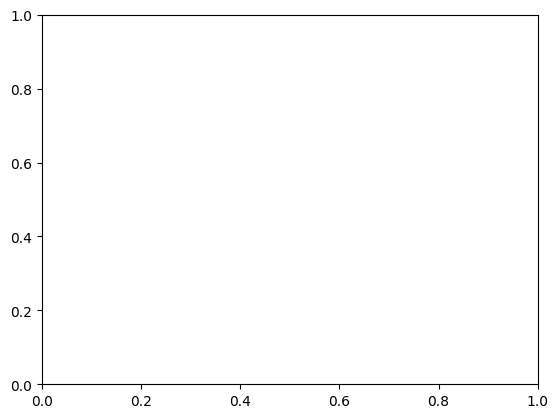

In [ ]:
# ==========================
# NO NOTEBOOK — reload pela ordem certa (package)
# ==========================
import importlib
from library import eps_zones, update_eps

# 1) reload eps_zones (passa a expor calcular_eps_e_voronoi)
importlib.reload(eps_zones)

# 2) reload update_eps (já consegue importar calcular_eps_e_voronoi)
importlib.reload(update_eps)

# 3) importar a função
from library.update_eps import criar_update




from matplotlib.patches import Polygon as MplPolygon
from matplotlib.collections import LineCollection
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython.display import HTML
import pandas as pd
import numpy as np

# ==========================
# 2. Limpeza de patches anteriores
# ==========================
for patch in ax.patches[:]:
    if isinstance(patch, MplPolygon):
        patch.remove()

# ==========================
# 3. Patch da área visível (sem fill)
# ==========================
visible_poly_patch = MplPolygon([[0, 0]], closed=True,
                                edgecolor='red', facecolor='none',
                                linewidth=1.5, zorder=4, visible=False)
ax.add_patch(visible_poly_patch)

# ==========================
# 4. Labels para zonas EPS
# ==========================
labels_zonas = [
    ax.text(0, 0, '', fontsize=15, ha='center', color='orange', zorder=15)
    for _ in range(50)
]

# ==========================
# 5. EPS inicial (frame 0 — cálculo do centroide interno)
# ==========================
df_inicial = df_minuto[
    (df_minuto["timestamp"] == ranked_timestamps.loc[0, "timestamp"]) &
    (df_minuto["period"] == ranked_timestamps.loc[0, "period"])
]
ataque_direita = (ranked_timestamps.loc[0, "period"] == 1)
polys_eps, centroide = calcular_eps_polygons(df_inicial, ataque_direita=ataque_direita)

# ==========================
# 6. Patches “placeholders” das 12 zonas (ficam escondidos)
# ==========================
eps_collection = []
for poly_coords in polys_eps:
    if poly_coords is None:
        patch = MplPolygon([[0, 0]], closed=True, visible=False)
    else:
        patch = MplPolygon(poly_coords, closed=True,
                           edgecolor='none', facecolor='none',
                           linewidth=0.0, zorder=5, visible=False)
    ax.add_patch(patch)
    eps_collection.append(patch)

# ==========================
# 7. Artistas extra: EPS branco, arestas Voronoi, raios angulares
# ==========================
# EPS (convex hull) branco
eps_hull_patch = MplPolygon([[0, 0]], closed=True,
                            facecolor='white', alpha=0.80,
                            edgecolor='none', zorder=3, visible=False)
ax.add_patch(eps_hull_patch)

# Arestas Voronoi dentro do EPS
voronoi_lines = LineCollection([], colors='black',
                               linewidths=1.0, alpha=0.85, zorder=4)
ax.add_collection(voronoi_lines)

# Raios de fronteira (sem círculos)
sector_rays = LineCollection([], colors='orange',
                             linewidths=2.0, alpha=1.0, zorder=6)
ax.add_collection(sector_rays)

# ==========================
# 8. Função update (passa eps_collection, labels e novos artistas)
# ==========================
update = criar_update(
    ranked_timestamps, df_minuto,
    azuis, vermelhos, highlight_actor, bola, actor_nome,
    visible_poly_patch, eps_collection, labels_zonas,
    titulo, metricas_esquerda, metricas_direita,
    equipa_azul, equipa_vermelha, equipa_esquerda,
    eps_hull_patch=eps_hull_patch,
    voronoi_lines=voronoi_lines,
    sector_rays=sector_rays
)

# ==========================
# 9. Animação
# ==========================
plt.grid(False)  # sem grelha
ani = FuncAnimation(
    fig, update,
    frames=len(ranked_timestamps),
    interval=500, blit=False, repeat=False
)

plt.close(fig)
HTML(ani.to_jshtml())


In [ ]:
end_time = time.time()
elapsed_time = end_time - start_time
print(f"⏱️ O notebook demorou {elapsed_time:.2f} segundos a correr.")

⏱️ O notebook demorou 42.27 segundos a correr.
